<a href="https://colab.research.google.com/github/SushmaRajagopal/Freshness-Grading-of-Tomato-using-Fast-RCNN/blob/main/tomato_using_fast_r_cnn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch
!pip install torchvision
!pip install cython pyyaml
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 755.5/755.5 MB 2.2 MB/s eta 0:00:00
  Attempting uninstall: torch
    Found existing installation: torch 2.2.2
    Uninstalling torch-2.2.2:
      Successfully uninstalled torch-2.2.2


  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-h1pu08ym
  Running command git clone --filter=blob:none --quiet https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-h1pu08ym
  Resolved https://github.com/cocodataset/cocoapi.git to commit 8c9bcc3cf640524c4c20a9c40e89cb6a2f2fa0e9
  Preparing metadata (setup.py) ... done
2.2.2+cu121 True
gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
Copyright (C) 2021 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [ ]:
! pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-rcjccrsx
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-rcjccrsx
  Resolved https://github.com/facebookresearch/detectron2.git to commit afe9eb920646102f7e6bf0cd2115841cea2aca13
  Preparing metadata (setup.py) ... done


In [ ]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

In [ ]:
!curl -L "https://app.roboflow.com/ds/uy0pQumGWv?key=AEHKelHKC4" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   901  100   901    0     0   3367      0 --:--:-- --:--:-- --:--:--  3374
100 7063k  100 7063k    0     0  8906k      0 --:--:-- --:--:-- --:--:-- 20.9M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/_annotations.coco.json  
 extracting: test/k046_jpg.rf.a5895ad2f0589c40b4162e1281b8c004.jpg  
 extracting: test/m047_jpg.rf.c92e43b2cdbdd7444be74f7d8969d1a4.jpg  
 extracting: test/n009_jpg.rf.60eb68a96805ce155cb0c38fc9f0376b.jpg  
 extracting: test/n010_jpg.rf.eb29bd7e98b19e6a707ced9a1fee091b.jpg  
 extracting: test/n043_jpg.rf.048573c19489a5d218b88c8940b2facd.jpg  
 extracting: test/q002_jpg.rf.8c9f2959560d3c36e26007d0a5f6385d.jpg  
 extracting: test/q003_jpg.rf.2b126cf459dcda6708e3c88a28dd2e5e.jpg  
 extracting: test/q040_jpg.rf.d33b23be18

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")


WARNING [04/02 06:37:45 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/02 06:37:45 d2.data.datasets.coco]: Loaded 189 images in COCO format from /content/train/_annotations.coco.json


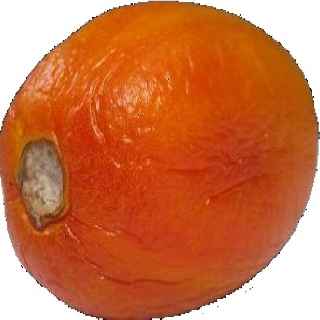

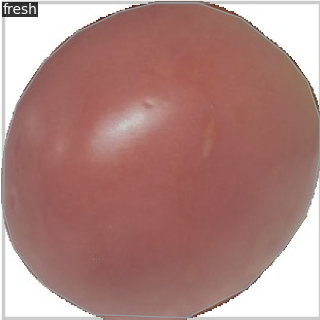

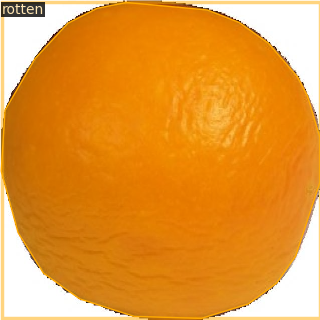

In [ ]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [ ]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [ ]:
#from .detectron2.tools.train_net import Trainer
#from detectron2.engine import DefaultTrainer
# select from modelzoo here: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md#coco-object-detection-baselines

from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001


cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 1500 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = (1000, )
cfg.SOLVER.GAMMA = 0.05




cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 5 #your number of classes + 1

cfg.TEST.EVAL_PERIOD = 500


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[04/02 06:38:39 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_68b088.pkl: 421MB [00:03, 121MB/s]                            
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[04/02 06:38:42 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[04/02 06:39:24 d2.utils.events]:  eta: 0:46:02  iter: 19  total_loss: 2.257  loss_cls: 1.6  loss_box_reg: 0.6526  loss_rpn_cls: 0.0001866  loss_rpn_loc: 0.007087    time: 1.8757  last_time: 1.8313  data_time: 0.0432  last_data_time: 0.0431   lr: 1.931e-06  max_mem: 7279M
[04/02 06:40:12 d2.utils.events]:  eta: 0:49:07  iter: 39  total_loss: 2.173  loss_cls: 1.528  loss_box_reg: 0.6632  loss_rpn_cls: 0.0002912  loss_rpn_loc: 0.006689    time: 1.9781  last_time: 2.2982  data_time: 0.0254  last_data_time: 0.0179   lr: 2.911e-06  max_mem: 7279M
[04/02 06:40:53 d2.utils.events]:  eta: 0:48:35  iter: 59  total_loss: 2.046  loss_cls: 1.405  loss_box_reg: 0.6353  loss_rpn_cls: 0.0002935  loss_rpn_loc: 0.006742    time: 2.0145  last_time: 2.1465  data_time: 0.0282  last_data_time: 0.0169   lr: 3.891e-06  max_mem: 7279M
[04/02 06:41:33 d2.utils.events]:  eta: 0:47:15  iter: 79  total_loss: 1.965  loss_cls: 1.246  loss_box_reg: 0.6973  loss_rpn_cls: 0.0002689  loss_rpn_loc: 0.006581    time: 2.0

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[04/02 06:56:01 d2.evaluation.evaluator]: Inference done 11/31. Dataloading: 0.0014 s/iter. Inference: 0.1881 s/iter. Eval: 0.0003 s/iter. Total: 0.1898 s/iter. ETA=0:00:03
[04/02 06:56:05 d2.evaluation.evaluator]: Total inference time: 0:00:05.055061 (0.194425 s / iter per device, on 1 devices)
[04/02 06:56:05 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:04 (0.187265 s / iter per device, on 1 devices)
[04/02 06:56:05 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[04/02 06:56:05 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[04/02 06:56:05 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[04/02 06:56:05 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[04/02 06:56:05 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.02 seconds.
[04/02 06:56:05 d2.evaluation

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[04/02 07:13:12 d2.evaluation.evaluator]: Inference done 11/31. Dataloading: 0.0013 s/iter. Inference: 0.1864 s/iter. Eval: 0.0003 s/iter. Total: 0.1881 s/iter. ETA=0:00:03
[04/02 07:13:16 d2.evaluation.evaluator]: Total inference time: 0:00:05.056240 (0.194471 s / iter per device, on 1 devices)
[04/02 07:13:16 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:04 (0.186116 s / iter per device, on 1 devices)
[04/02 07:13:16 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[04/02 07:13:16 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[04/02 07:13:16 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[04/02 07:13:16 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[04/02 07:13:16 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.02 seconds.
[04/02 07:13:16 d2.evaluation

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[04/02 07:30:38 d2.evaluation.evaluator]: Inference done 11/31. Dataloading: 0.0081 s/iter. Inference: 0.1833 s/iter. Eval: 0.0006 s/iter. Total: 0.1920 s/iter. ETA=0:00:03
[04/02 07:30:42 d2.evaluation.evaluator]: Total inference time: 0:00:05.006137 (0.192544 s / iter per device, on 1 devices)
[04/02 07:30:42 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:04 (0.184724 s / iter per device, on 1 devices)
[04/02 07:30:42 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[04/02 07:30:42 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[04/02 07:30:42 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[04/02 07:30:42 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[04/02 07:30:42 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.
[04/02 07:30:42 d2.evaluation

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [ ]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

[04/02 07:31:39 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...
WARNING [04/02 07:31:39 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [04/02 07:31:39 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/02 07:31:40 d2.data.datasets.coco]: Loaded 15 images in COCO format from /content/test/_annotations.coco.json
[04/02 07:31:40 d2.data.build]: Distribution of instances among all 5 categories:
|   category    | #instances   |  category  | #instances   |  category   | #instances   |
|:-------------:|:-------------|:----------:|:-------------|:-----------:|:-------------|
| tomato-imag.. | 0            |   fresh    | 10           | fully fresh | 0            |
| fully rotten  | 5            |   rotten   | 1            |             |              |
|     total     |

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[04/02 07:31:42 d2.evaluation.evaluator]: Inference done 11/15. Dataloading: 0.0013 s/iter. Inference: 0.1835 s/iter. Eval: 0.0003 s/iter. Total: 0.1850 s/iter. ETA=0:00:00
[04/02 07:31:43 d2.evaluation.evaluator]: Total inference time: 0:00:01.971343 (0.197134 s / iter per device, on 1 devices)
[04/02 07:31:43 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:01 (0.183825 s / iter per device, on 1 devices)
[04/02 07:31:43 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[04/02 07:31:43 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[04/02 07:31:43 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[04/02 07:31:43 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[04/02 07:31:43 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.
[04/02 07:31:43 d2.evaluation.

OrderedDict([('bbox',
              {'AP': 60.79207920792079,
               'AP50': 66.17161716171617,
               'AP75': 66.17161716171617,
               'APs': nan,
               'APm': 0.0,
               'APl': 63.432343234323426,
               'AP-tomato-image-VUtz-wtdC': nan,
               'AP-fresh': 80.19801980198021,
               'AP-fully fresh': nan,
               'AP-fully rotten': 62.17821782178218,
               'AP-rotten': 40.0})])

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")

[04/02 07:32:07 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


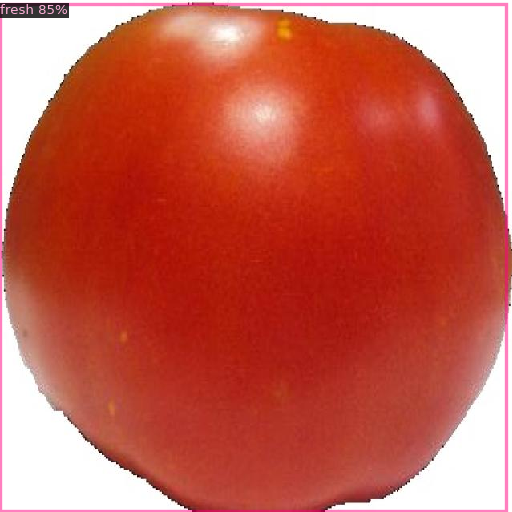

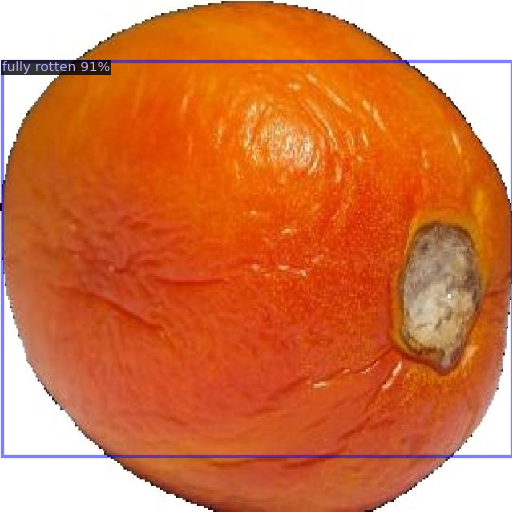

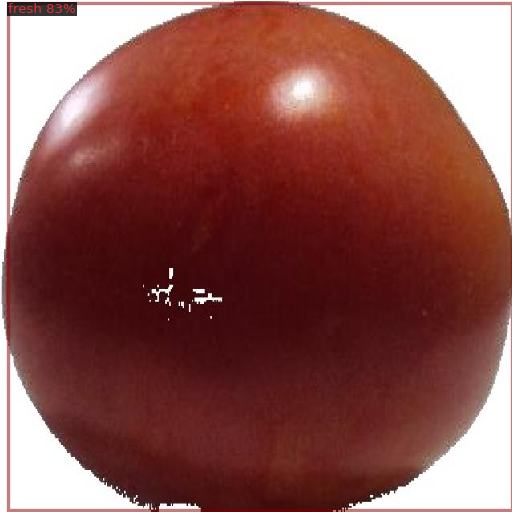

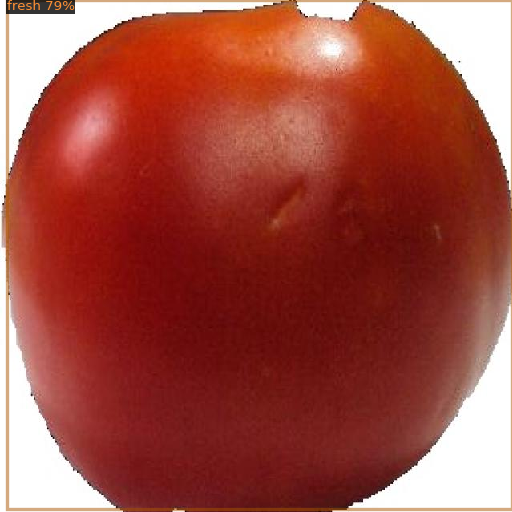

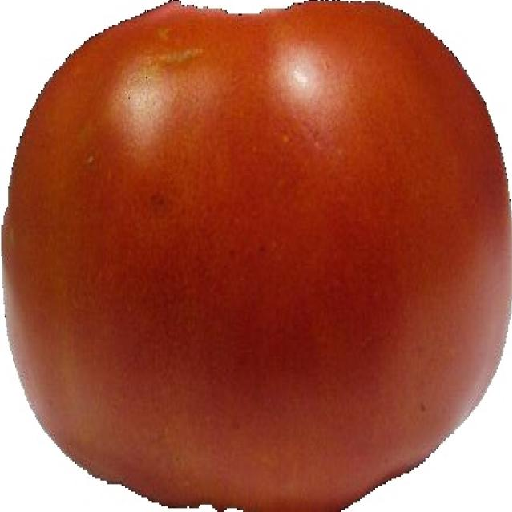

...

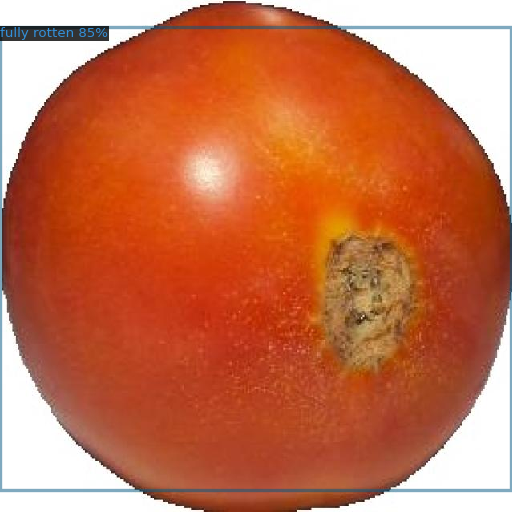

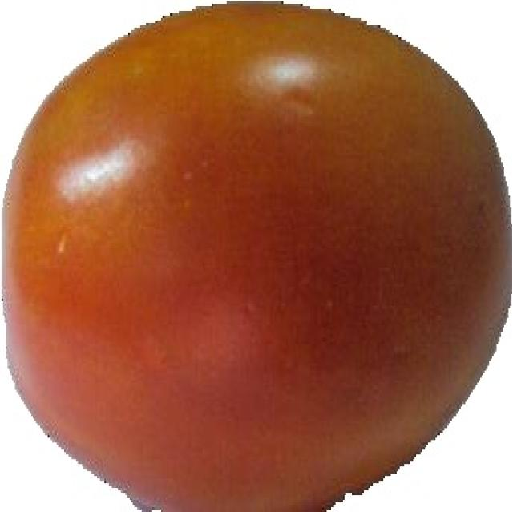

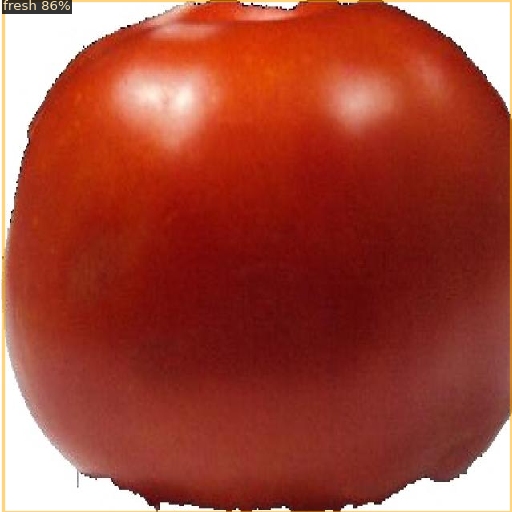

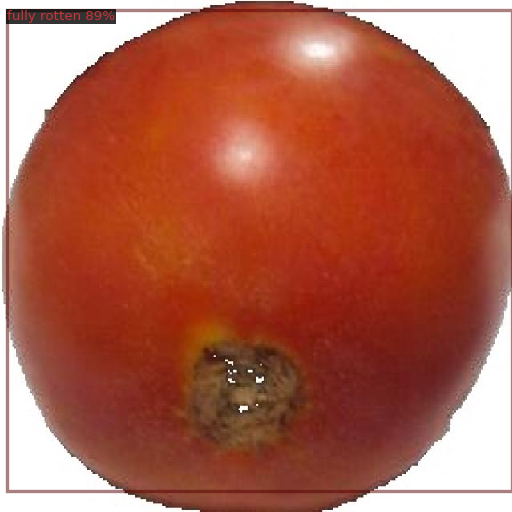

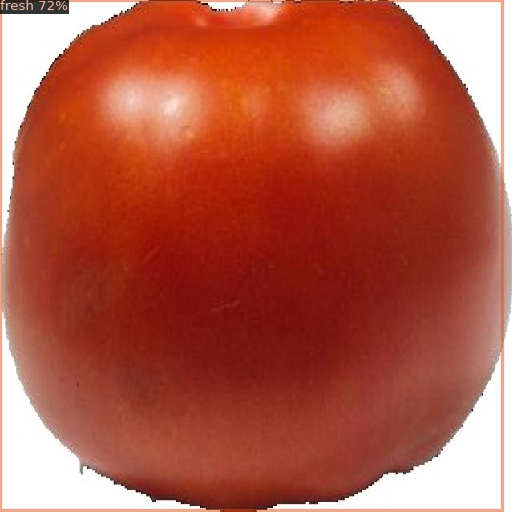

In [ ]:
from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob('/content/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata,
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])
